# <center><u>Term deposit marketing</u></center>


## Business Problem

**Background:**

We are a small startup focusing mainly on providing machine learning solutions in the European banking market. We work on a variety of problems including fraud detection, sentiment classification and customer intention prediction and classification.

We are interested in developing a robust machine learning system that leverages information coming from call center data.

Ultimately, we are looking for ways to improve the success rate for calls made to customers for any product that our clients offer. Towards this goal we are working on designing an ever evolving machine learning product that offers high success outcomes while offering interpretability for our clients to make informed decisions.

**Data Description:**

The data comes from direct marketing efforts of a European banking institution. The marketing campaign involves making a phone call to a customer, often multiple times to ensure a product subscription, in this case a term deposit. Term deposits are usually short-term deposits with maturities ranging from one month to a few years. The customer must understand when buying a term deposit that they can withdraw their funds only after the term ends. All customer information that might reveal personal information is removed due to privacy concerns.

**Attributes:**

age : age of customer (numeric)

job : type of job (categorical)

marital : marital status (categorical)

education (categorical)

default: has credit in default? (binary)

balance: average yearly balance, in euros (numeric)

housing: has a housing loan? (binary)

loan: has personal loan? (binary)

contact: contact communication type (categorical)

day: last contact day of the month (numeric)

month: last contact month of year (categorical)

duration: last contact duration, in seconds (numeric)

campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)

**Output (desired target):**

y - has the client subscribed to a term deposit? (binary)


## Import necessary libraries 

In [4]:
# import main libraries
import pandas as pd
import seaborn as sns
import numpy as np
from numpy import mean, std


import matplotlib.pyplot as plt
from matplotlib import gridspec
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn.model_selection import (
    train_test_split,
    StratifiedKFold,
    GridSearchCV,
    RandomizedSearchCV,
)
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.feature_selection import RFE
from sklearn.linear_model import Perceptron
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc, roc_auc_score, make_scorer
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.model_selection import cross_val_score
from xgboost import XGBClassifier
from sklearn.feature_selection import RFE
from sklearn.linear_model import Perceptron
import pandas as pd
from pycaret.classification import (
    setup,
    compare_models,
    predict_model,
    evaluate_model,
    add_metric,
    get_metrics,
)
import warnings

warnings.filterwarnings("ignore")

# Data collection and explorartion


In [5]:
# Load the dataset
df_data = pd.read_csv("term-deposit-marketing-2020.csv")

In [6]:
# Display some rows first and last 5 rows of the dataset

pd.concat([df_data.head(), df_data.tail()])

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,no
39995,53,technician,married,tertiary,no,395,no,no,cellular,3,jun,107,1,no
39996,30,management,single,tertiary,no,3340,no,no,cellular,3,jun,238,3,yes
39997,54,admin,divorced,secondary,no,200,no,no,cellular,3,jun,170,1,yes
39998,34,management,married,tertiary,no,1047,no,no,cellular,3,jun,342,1,no
39999,38,technician,married,secondary,no,1442,yes,no,cellular,3,jun,113,1,no


In [7]:
# Dimensions of dataset (rows , columns)
df_data.shape

(40000, 14)

The dataset contains 126 observations, 6 independent variables (X) and 1 dependent variable (Y).


In [8]:
# Show dataset information,
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        40000 non-null  int64 
 1   job        40000 non-null  object
 2   marital    40000 non-null  object
 3   education  40000 non-null  object
 4   default    40000 non-null  object
 5   balance    40000 non-null  int64 
 6   housing    40000 non-null  object
 7   loan       40000 non-null  object
 8   contact    40000 non-null  object
 9   day        40000 non-null  int64 
 10  month      40000 non-null  object
 11  duration   40000 non-null  int64 
 12  campaign   40000 non-null  int64 
 13  y          40000 non-null  object
dtypes: int64(5), object(9)
memory usage: 4.3+ MB


We can see that there is no Null value, all values are numeric (int64)


#### Check missing data


In [9]:
# Check missing data
print(
    "Number of cases with missing values: " + str(df_data.isnull().values.ravel().sum())
)

Number of cases with missing values: 0


There is no missing data


#### Check duplicate rows


In [10]:
df_data.duplicated().sum()

0

There are no duplicate rows in the dataset


In [11]:
# Diplay dataset decription
df_data.describe()

,age,balance,day,duration,campaign
count,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000
mean,40.544600,1274.277550,16.017225,254.824300,2.882175
std,9.641776,2903.769716,8.278127,259.366498,3.239051
min,19.000000,-8019.000000,1.000000,0.000000,1.000000
25%,33.000000,54.000000,8.000000,100.000000,1.000000
50%,39.000000,407.000000,17.000000,175.000000,2.000000
75%,48.000000,1319.000000,21.000000,313.000000,3.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000


# Exploratory Data Analysis(EDA)


### Exploration and Visualization

We try to find out the relative proportion of happy and unhappy customers


Customers with term deposit: 2896
Customers without term deposit: 37104
Proportion of Customers with term deposit: 0.0724
Proportion of Customers without term deposit: 0.9276


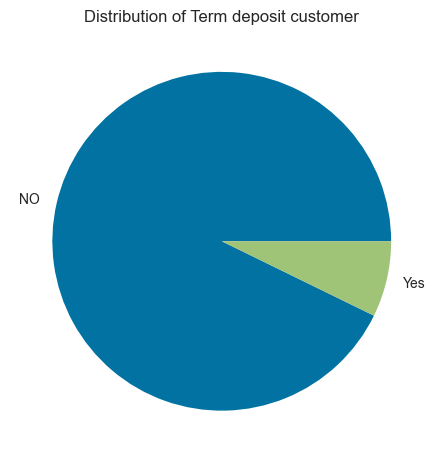

In [12]:
print("Customers with term deposit: " + str(len(df_data[df_data["y"] == 'yes'])))
print("Customers without term deposit: " + str(len(df_data[df_data["y"] == 'no'])))
print(
    "Proportion of Customers with term deposit: "
    + str(len(df_data[df_data["y"] == 'yes']) / df_data.shape[0])
)
print(
    "Proportion of Customers without term deposit: "
    + str(len(df_data[df_data["y"] == 'no']) / df_data.shape[0])
)

# To see how small are the number of Fraud transactions
cust_data_pi = df_data.copy()
cust_data_pi["Term deposit"] = np.where(cust_data_pi["y"] == 'yes', "Yes", "NO")

%matplotlib inline
cust_data_pi["Term deposit"].value_counts().plot(kind="pie")
plt.title("Distribution of Term deposit customer")
plt.ylabel("")
plt.show()

The dataset is unbalanced, with 93% of customers lacking a term deposit and 7% of customers subscribing to a term deposit. This implies that the company must exert additional effort to persuade a greater number of individuals to subscribe to the term deposit product, as a small number of consumers utilize this service.


## Bivariate analysis between features and target variables

### Count categorical variables


In [13]:
for cat_col in df_data.select_dtypes(include=["object"]).columns:
    print(f"====== {cat_col} =======")
    print(df_data[cat_col].value_counts())

====== job =======
job
blue-collar      9383
management       8166
technician       6852
admin            4483
services         3910
retired          1437
self-employed    1414
entrepreneur     1405
unemployed       1104
housemaid        1087
student           524
unknown           235
Name: count, dtype: int64
====== marital =======
marital
married     24386
single      10889
divorced     4725
Name: count, dtype: int64
====== education =======
education
secondary    20993
tertiary     11206
primary       6270
unknown       1531
Name: count, dtype: int64
====== default =======
default
no     39191
yes      809
Name: count, dtype: int64
====== housing =======
housing
yes    24031
no     15969
Name: count, dtype: int64
====== loan =======
loan
no     33070
yes     6930
Name: count, dtype: int64
====== contact =======
contact
cellular     24914
unknown      12765
telephone     2321
Name: count, dtype: int64
====== month =======
month
may    13532
jul     6380
aug     5215
jun     4734
nov

#### The 'unknown' value representation


In [14]:
# Function to calculate percentage of 'unknown' values in each column
def calculate_unknown_percentage(df):
    unknown_percentages = {}
    for column in df.columns:
        unknown_count = (df[column] == "unknown").sum()
        total_count = len(df[column])
        percentage = (unknown_count / total_count) * 100
        if unknown_count > 0:
            unknown_percentages[column] = f"{percentage.round(2)}%"
    return unknown_percentages


# Calculate and print the percentages
unknown_percentages = calculate_unknown_percentage(df_data)
print(unknown_percentages)

{'job': '0.59%', 'education': '3.83%', 'contact': '31.91%'}


Contact variable have a significant 'unknown' value representation 32%. But it should not impact our analysis since the other values ('cellular', 'telephone') are from the same family.


##### Extract categorical and numerical variables


In [15]:
categorical_columns = df_data.select_dtypes(include=["object"]).columns.tolist()
numerical_columns = df_data.select_dtypes(include=["number"]).columns.tolist()

print("Categorical columns:", categorical_columns)
print("Numerical columns:", numerical_columns)

Categorical columns: ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'y']
Numerical columns: ['age', 'balance', 'day', 'duration', 'campaign']


##### Convert month to numerical


In [16]:
# Convert month names to numerical values
df_data.insert(9, "month_num", pd.to_datetime(df_data["month"], format="%b").dt.month)
# add month_num to numerical columns list
numerical_columns.append("month_num")

#### Numerical features distribution

##### Using Histograms to visualize the distribution of numerical features

In [17]:
# Number of columns for subplots (2 per row)
cols = 1
# Number of rows needed
rows = (len(numerical_columns) + cols - 1) // cols

# Create subplots
fig = make_subplots(rows=rows, cols=cols, subplot_titles=numerical_columns)
# Define colors for the categories
colors = {"yes": "coral", "no": "cornflowerblue"}
# Add histograms to subplots
for i, column in enumerate(numerical_columns):
    row = i // cols + 1
    col = i % cols + 1

    # Create histogram for the numerical column separated by 'y'
    for category in df_data["y"].unique():
        histogram = go.Histogram(
            x=df_data[df_data["y"] == category][column],
            name=str(category),
            opacity=0.75,
            nbinsx=len(df_data[column].unique()),
            marker_color=colors[category],  # Set color based on category
            legendgroup="y",  # Group by 'y' for a single legend
            showlegend=(
                True if i == 0 else False
            ),  # Show legend only for the first subplot
        )
        fig.add_trace(histogram, row=row, col=col)

    fig.update_xaxes(title_text=column, row=row, col=col)
    fig.update_yaxes(title_text="Count", row=row, col=col)

# Update layout
fig.update_layout(
    height=rows * 400,
    width=1024,
    title_text="Distribution of Numerical Columns Related to y",
    barmode="overlay",  # or 'group' depending on your preference
    showlegend=True,
)

# Show the plot
fig.show()

##### Using Boxplot to visualize the distribution of numerical features

In [18]:
# Number of columns for subplots (2 per row)
cols = 2
# Number of rows needed
rows = (len(numerical_columns) + cols - 1) // cols

# Create subplots
fig = make_subplots(rows=rows, cols=cols, subplot_titles=numerical_columns)

# Add box plots to subplots
for i, column in enumerate(numerical_columns):
    row = i // cols + 1
    col = i % cols + 1

    box_plot = px.box(df_data, x="y", y=column, color="y")

    for trace in box_plot["data"]:
        fig.add_trace(trace, row=row, col=col)

    fig.update_xaxes(title_text="y", row=row, col=col)
    fig.update_yaxes(title_text=column, row=row, col=col)

# Update layout
fig.update_layout(
    height=rows * 400,
    width=1000,
    title_text="Distribution of Numerical Columns by y",
    showlegend=False,
)
fig.show()

##### Grouping age


In [19]:
# Grouping various age groups and placing them into bins for histogram

cut_labels = [
    "< 18",
    "18-27",
    "28-37",
    "38-47",
    "48-57",
    "58-67",
    "68-77",
    "78-87",
    "> 87",
]
cut_bins = [0, 17, 27, 37, 47, 57, 67, 77, 87, 100]
df_data["age_group"] = pd.cut(df_data["age"], bins=cut_bins, labels=cut_labels)

In [20]:
df_data["age_group"]

0        58-67
1        38-47
2        28-37
3        38-47
4        28-37
         ...  
39995    48-57
39996    28-37
39997    48-57
39998    28-37
39999    38-47
Name: age_group, Length: 40000, dtype: category
Categories (9, object): ['< 18' < '18-27' < '28-37' < '38-47' ... '58-67' < '68-77' < '78-87' < '> 87']

In [21]:
# Creating a dictionary to keep count of values falling under the age groups
dict_age = {}
for row in df_data["age_group"]:
    if row not in dict_age:
        print(row)
        dict_age[row] = 1
    else:
        dict_age[row] = dict_age[row] + 1

# Histogram to show number of values/individuals present in each age group
# It also shows that either there's a low life expectancy or the surveyed people didn't consist of old people much

fig = px.bar(
    x=list(dict_age.keys()),
    y=list(dict_age.values()),  # data from df columns
    title="Age Range",
    color=list(dict_age.keys()),
)
fig.update_xaxes(categoryorder="array", categoryarray=cut_labels)

fig.show()

58-67
38-47
28-37
48-57
18-27
78-87
68-77
> 87


#### Categorical features distribution

In [22]:
categorical_columns

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'y']

In [23]:
categorical_columns

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'y']

In [24]:
# Number of rows needed
# categorical_columns_1 = categorical_columns.remove('month')
categorical_columns_1 = [
    value for value in categorical_columns if value not in ["month", "y"]
]
rows = (len(categorical_columns_1) + cols - 1) // cols

# Create subplots
fig = make_subplots(rows=rows, cols=cols, subplot_titles=categorical_columns_1)


# Add bar plots to subplots
for i, column in enumerate(categorical_columns_1):
    row = i // cols + 1
    col = i % cols + 1

    # Create bar plot for the categorical column separated by 'y'
    for category in df_data["y"].unique():
        bar_plot = go.Bar(
            x=df_data[df_data["y"] == category][column].value_counts().index,
            y=df_data[df_data["y"] == category][column].value_counts().values,
            name=str(category),
            opacity=0.75,
            marker_color=colors[category],  # Set color based on category
            legendgroup="y",  # Group by 'y' for a single legend
            showlegend=(
                True if i == 0 else False
            ),  # Show legend only for the first subplot
        )
        fig.add_trace(bar_plot, row=row, col=col)

    fig.update_xaxes(title_text=column, row=row, col=col)
    fig.update_yaxes(title_text="Count", row=row, col=col)

# Update layout
fig.update_layout(
    height=rows * 400,
    width=1024,
    title_text="Distribution of Categorical Columns Related to y",
    barmode="group",
    showlegend=True,
)

#### Handling categorical variables

##### Replace education with numerical values

In [25]:
categorical_columns

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'y']

In [26]:
# Educated sorted list
sorted_education = {"unknown": 0, "primary": 1, "secondary": 2, "tertiary": 3}
# Apply the mapping to the 'education' column
df_data["education"] = df_data["education"].map(sorted_education)

##### Replace 'yes' and 'no' with numerical values 1 and 0 respectively

In [27]:
yes_no_mapping = {"yes": 1, "no": 0}
yes_no_columns = ["default", "housing", "loan", "y"]
# Replace 'yes' with 1 and 'no' with 0
df_data[yes_no_columns] = df_data[yes_no_columns].replace(yes_no_mapping)

##### One hot encoding for other nominal categorical variables

In [28]:
df_data_final = pd.get_dummies(
    df_data, columns=["job", "marital", "contact"], drop_first=True, dtype="int"
)

##### Drop other columns that are not needed

In [29]:
df_data_final.drop(columns=["month", "age_group"], inplace=True)

In [30]:
df_data_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   age                40000 non-null  int64
 1   education          40000 non-null  int64
 2   default            40000 non-null  int64
 3   balance            40000 non-null  int64
 4   housing            40000 non-null  int64
 5   loan               40000 non-null  int64
 6   month_num          40000 non-null  int32
 7   day                40000 non-null  int64
 8   duration           40000 non-null  int64
 9   campaign           40000 non-null  int64
 10  y                  40000 non-null  int64
 11  job_blue-collar    40000 non-null  int32
 12  job_entrepreneur   40000 non-null  int32
 13  job_housemaid      40000 non-null  int32
 14  job_management     40000 non-null  int32
 15  job_retired        40000 non-null  int32
 16  job_self-employed  40000 non-null  int32
 17  job_services

In [31]:
df_data

,age,job,marital,education,default,balance,housing,loan,contact,month_num,day,month,duration,campaign,y,age_group
0,58,management,married,3,0,2143,1,0,unknown,5,5,may,261,1,0,58-67
1,44,technician,single,2,0,29,1,0,unknown,5,5,may,151,1,0,38-47
2,33,entrepreneur,married,2,0,2,1,1,unknown,5,5,may,76,1,0,28-37
3,47,blue-collar,married,0,0,1506,1,0,unknown,5,5,may,92,1,0,38-47
4,33,unknown,single,0,0,1,0,0,unknown,5,5,may,198,1,0,28-37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39995,53,technician,married,3,0,395,0,0,cellular,6,3,jun,107,1,0,48-57
39996,30,management,single,3,0,3340,0,0,cellular,6,3,jun,238,3,1,28-37
39997,54,admin,divorced,2,0,200,0,0,cellular,6,3,jun,170,1,1,48-57
39998,34,management,married,3,0,1047,0,0,cellular,6,3,jun,342,1,0,28-37


#### Corellation matrix

In [32]:
# This corelation Graph shows the relationship of all variable in dataset to each other
#  It also shows how different variables play a role in determining income of an individual
numerical_columns_2 = df_data.select_dtypes(include=["number"]).columns.tolist()
corr = df_data[numerical_columns_2].corr()
corr.style.background_gradient(cmap="coolwarm")

,age,education,default,balance,housing,loan,month_num,day,duration,campaign,y
age,1.000000,-0.161471,-0.014857,0.081517,-0.179606,0.000041,0.095266,-0.011689,-0.036270,0.016204,-0.020273
education,-0.161471,1.000000,-0.007390,0.052765,-0.044800,0.005370,0.075412,0.032272,0.004813,0.006220,0.043828
default,-0.014857,-0.007390,1.000000,-0.070069,-0.019229,0.075006,0.024472,0.006287,-0.008597,0.012135,-0.006559
balance,0.081517,0.052765,-0.070069,1.000000,-0.049946,-0.080596,0.099736,0.011662,0.014072,-0.008137,0.030232
housing,-0.179606,-0.044800,-0.019229,-0.049946,1.000000,0.004266,-0.161402,-0.050622,0.022455,-0.054823,-0.054336
loan,0.000041,0.005370,0.075006,-0.080596,0.004266,1.000000,0.044699,0.005838,-0.003952,0.000582,-0.031029
month_num,0.095266,0.075412,0.024472,0.099736,-0.161402,0.044699,1.000000,0.142358,-0.021329,0.082301,-0.043784
day,-0.011689,0.032272,0.006287,0.011662,-0.050622,0.005838,0.142358,1.000000,-0.032983,0.165429,-0.006420
duration,-0.036270,0.004813,-0.008597,0.014072,0.022455,-0.003952,-0.021329,-0.032983,1.000000,-0.088387,0.461169
campaign,0.016204,0.006220,0.012135,-0.008137,-0.054823,0.000582,0.082301,0.165429,-0.088387,1.000000,-0.040350


# Model building 

Initiate seed for reproducibility

In [33]:
import random


# set seed

seed = random.randint(1000, 9999)



print("Seed:", seed)

Seed: 2367


## Layer 1 : Model for selecting person to call

The first step is to create a model that will predict whether a person should be contacted based on his information. Since we have a huge dataset (40000), it is better and efficient to reduce the call number by extracting only customers that are likely to subscribe to the service.
For this, we need to extcat only information related to the customer and exclude the infomation related to the call. The best model will have the highest recall score for class 1.

### Exctract non related call features

In [34]:
df_no_call = df_data_final.drop(["month_num", "day", "duration", "campaign"], axis=1)

### Split the data into features and target

In [39]:
# Move the 'y' column to the end
y_column = df_no_call.pop("y")
df_no_call["y"] = y_column


# Separate response and features
y = df_no_call["y"]
X = df_no_call.iloc[:, :21]

# Create a stratified split to maintain the class distribution
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)

# Preprocess the data
scaler = StandardScaler().set_output(transform="pandas")
X_scaled = scaler.fit_transform(X)
# split the data to train the final model
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=seed, stratify=y
)

In [37]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((32000, 21), (8000, 21), (32000,), (8000,))

In [38]:
y_train.value_counts()

y
0    29683
1     2317
Name: count, dtype: int64

### LazyPredict with imbalanced dataset

In [ ]:
from lazypredict import LazyClassifier
from sklearn.metrics import recall_score
import pandas as pd


# Define the custom scoring function
def recall_label_1(y_true, y_pred):
    return recall_score(y_true, y_pred, pos_label=1)


# Create a LazyClassifier instance
lc = LazyClassifier(verbose=0, custom_metric=recall_label_1)

# Fit the LazyClassifier instance
lc.fit(X_train, X_test, y_train, y_test)

# Run Lazy predict training
# lazy_clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models, predictions = lc.fit(X_train, X_test, y_train, y_test)

In [88]:
models

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,recall_label_1,Time Taken
Model,,,,,,
NearestCentroid,0.61,0.59,0.59,0.70,0.57,0.06
Perceptron,0.77,0.55,0.55,0.81,0.29,0.10
DecisionTreeClassifier,0.87,0.54,0.54,0.87,0.16,0.27
ExtraTreesClassifier,0.90,0.53,0.53,0.89,0.09,4.14
PassiveAggressiveClassifier,0.86,0.53,0.53,0.86,0.14,0.10
ExtraTreeClassifier,0.87,0.52,0.52,0.87,0.11,0.08
RandomForestClassifier,0.92,0.52,0.52,0.89,0.06,4.43
BaggingClassifier,0.92,0.52,0.52,0.89,0.06,1.61
QuadraticDiscriminantAnalysis,0.88,0.52,0.52,0.88,0.10,0.12


In [89]:
lazy_NearestCentroid = lc.models["NearestCentroid"]

In [92]:
lazy_NearestCentroid.fit(X_train, y_train)
y_pred_1 = lazy_NearestCentroid.predict(X_test)
print(classification_report(y_test, y_pred_1))
print(confusion_matrix(y_test, y_pred_1))

# lazy_dt = lc.models["DecisionTreeClassifier"]
# lazy_dt.fit(X_train, y_train)
# y_pred_1 = lazy_dt.predict(X_test)
# print(classification_report(y_test, y_pred_1))
# print(confusion_matrix(y_test, y_pred_1))

              precision    recall  f1-score   support

           0       0.95      0.61      0.74      7421
           1       0.10      0.57      0.17       579

    accuracy                           0.61      8000
   macro avg       0.53      0.59      0.46      8000
weighted avg       0.89      0.61      0.70      8000

[[4526 2895]
 [ 249  330]]


In [96]:
y_pred_train = lazy_NearestCentroid.predict(X_train)
y_pred_train

array([0, 1, 1, ..., 0, 0, 0], dtype=int64)

In [98]:
print(classification_report(y_train, y_pred_train))
print(confusion_matrix(y_train, y_pred_train))

              precision    recall  f1-score   support

           0       0.95      0.60      0.74     29683
           1       0.10      0.59      0.18      2317

    accuracy                           0.60     32000
   macro avg       0.53      0.60      0.46     32000
weighted avg       0.89      0.60      0.70     32000

[[17938 11745]
 [  953  1364]]


After training lazypredict, we have obtained the following results:
- best model for this case is NearestCentroid 
- We get a recall(1) score of 0.57 on the test set and 0.59 from the training set.

In [101]:
np.unique(y_pred_train, return_counts=True)

(array([0, 1], dtype=int64), array([18891, 13109], dtype=int64))

In [108]:
print(np.unique(y_train, return_counts=True))
print(np.unique(y_test, return_counts=True))

(array([0, 1], dtype=int64), array([29683,  2317], dtype=int64))
(array([0, 1], dtype=int64), array([7421,  579], dtype=int64))


### LazyPredict with balanced dataset

#### Balance dataset with SMOTE for oversampling and RandomUnderSampler for undersampling

In [42]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from collections import Counter

# summarize class distribution
counter = Counter(y)
print(counter)
# define pipeline
over = SMOTE(
    sampling_strategy=0.3, random_state=1
)  # sampling_strategy=0.1,random_state=1
under = RandomUnderSampler(sampling_strategy=0.5)
steps = [("o", over), ("u", under)]
pipeline = Pipeline(steps=steps)
# transform the dataset
Xb, yb = pipeline.fit_resample(X_scaled, y)
# summarize the new class distribution
counter = Counter(yb)
print(counter)

Counter({0: 37104, 1: 2896})
Counter({0: 22262, 1: 11131})


In [45]:
Xb.shape, yb.shape

((33393, 21), (33393,))

#### Split balanced dataset to train the final model

In [47]:
Xb_train, Xb_test, yb_train, yb_test = train_test_split(
    Xb, yb, test_size=0.2, random_state=seed, stratify=yb
)

#### Run lazypredict claasisifcation with balanced dataset

In [52]:
from lazypredict import LazyClassifier
from sklearn.metrics import recall_score
import pandas as pd


# Define the custom scoring function
def recall_label_1(y_true, y_pred):
    return recall_score(y_true, y_pred, pos_label=1)


# Create a LazyClassifier instance
lcb = LazyClassifier(verbose=0, custom_metric=recall_label_1)

# Fit the LazyClassifier instance
lcb.fit(Xb_train, Xb_test, yb_train, yb_test)

# Run Lazy predict training
# lazy_clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
modelsb, predictionsb = lcb.fit(Xb_train, Xb_test, yb_train, yb_test)

 97%|█████████▋| 28/29 [09:33<00:17, 17.45s/it]

[LightGBM] [Info] Number of positive: 8905, number of negative: 17809
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1245
[LightGBM] [Info] Number of data points in the train set: 26714, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333346 -> initscore=-0.693091
[LightGBM] [Info] Start training from score -0.693091


100%|██████████| 29/29 [09:36<00:00, 19.86s/it]


'tuple' object has no attribute '__name__'
Invalid Classifier(s)


 97%|█████████▋| 28/29 [15:32<00:15, 15.38s/it] 

[LightGBM] [Info] Number of positive: 8905, number of negative: 17809
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1245
[LightGBM] [Info] Number of data points in the train set: 26714, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333346 -> initscore=-0.693091
[LightGBM] [Info] Start training from score -0.693091


100%|██████████| 29/29 [15:33<00:00, 32.19s/it]


In [54]:
modelsb.sort_values(by="recall_label_1", ascending=False)

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,recall_label_1,Time Taken
Model,,,,,,
ExtraTreesClassifier,0.83,0.80,0.80,0.83,0.70,7.34
DecisionTreeClassifier,0.80,0.77,0.77,0.80,0.70,0.42
RandomForestClassifier,0.83,0.79,0.79,0.83,0.67,5.20
LGBMClassifier,0.88,0.82,0.82,0.87,0.65,0.79
KNeighborsClassifier,0.75,0.72,0.72,0.75,0.64,1.94
BaggingClassifier,0.83,0.78,0.78,0.82,0.64,3.18
ExtraTreeClassifier,0.77,0.73,0.73,0.77,0.64,0.15
NearestCentroid,0.60,0.60,0.60,0.61,0.61,0.03
LabelPropagation,0.77,0.73,0.73,0.77,0.59,110.49


Best model for this case is ExtraTreesClassifier with recall(1) score of 0.7

In [57]:
lazy_dt = lc.models["ExtraTreesClassifier"]
# lazy_dt = DecisionTreeClassifier(max_depth=5)  # max_depth=5, min_samples_split
lazy_dt.fit(Xb_train, yb_train)
yb_pred_dt = lazy_dt.predict(Xb_test)
yb_pred_dt_train = lazy_dt.predict(Xb_train)
yb_pred_dt_train
print(classification_report(yb_test, yb_pred_dt))
print(confusion_matrix(yb_test, yb_pred_dt))

              precision    recall  f1-score   support

           0       0.86      0.89      0.87      4453
           1       0.76      0.70      0.73      2226

    accuracy                           0.83      6679
   macro avg       0.81      0.80      0.80      6679
weighted avg       0.83      0.83      0.83      6679

[[3967  486]
 [ 663 1563]]


In [59]:
# lazy_dt.fit(X_train, y_train)
y_pred_dt = lazy_dt.predict(X_test)
y_pred_dt_train = lazy_dt.predict(X_train)
y_pred_dt_train
print(classification_report(y_train, y_pred_dt_train))
print(confusion_matrix(y_train, y_pred_dt_train))

print(classification_report(y_test, y_pred_dt))
print(confusion_matrix(y_test, y_pred_dt))

              precision    recall  f1-score   support

           0       0.99      0.94      0.96     29683
           1       0.53      0.87      0.66      2317

    accuracy                           0.94     32000
   macro avg       0.76      0.91      0.81     32000
weighted avg       0.96      0.94      0.94     32000

[[27926  1757]
 [  298  2019]]
              precision    recall  f1-score   support

           0       0.99      0.94      0.96      7421
           1       0.53      0.85      0.65       579

    accuracy                           0.93      8000
   macro avg       0.76      0.90      0.81      8000
weighted avg       0.95      0.93      0.94      8000

[[6983  438]
 [  87  492]]


For balanced dataset, the best model for this case is ExtraTreesClassifier with recall(1) score of 0.73 for the test set and 0.87 for the training set. The confusion matrix shows that

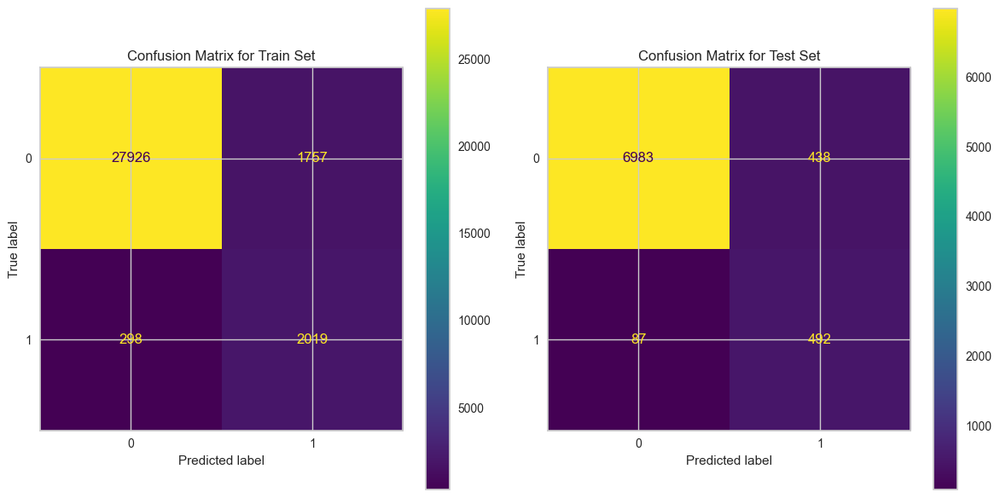

In [64]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
import numpy as np

# Calculate confusion matrices
conf_matrix_train = confusion_matrix(y_train, y_pred_dt_train)
conf_matrix_test = confusion_matrix(y_test, y_pred_dt)

# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 6), dpi=100)

# Plot confusion matrix for train set on the first subplot
display_train = ConfusionMatrixDisplay(
    conf_matrix_train, display_labels=lazy_dt.classes_
)
display_train.plot(ax=axs[0])
axs[0].set(title="Confusion Matrix for Train Set")

# Plot confusion matrix for test set on the second subplot
display_test = ConfusionMatrixDisplay(conf_matrix_test, display_labels=lazy_dt.classes_)
display_test.plot(ax=axs[1])
axs[1].set(title="Confusion Matrix for Test Set")

# Layout so plots do not overlap
fig.tight_layout()

# Show the plot
plt.show()

## Layer 2 : Model for predecting term deposit subscription

### Data splitting

In [193]:
# Move the 'y' column to the end
y_column = df_data_final.pop("y")
df_data_final["y"] = y_column

Seed: 5345


In [31]:
df_data_final.iloc[:, :25].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 25 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   age                40000 non-null  int64
 1   education          40000 non-null  int64
 2   default            40000 non-null  int64
 3   balance            40000 non-null  int64
 4   housing            40000 non-null  int64
 5   loan               40000 non-null  int64
 6   month_num          40000 non-null  int32
 7   day                40000 non-null  int64
 8   duration           40000 non-null  int64
 9   campaign           40000 non-null  int64
 10  job_blue-collar    40000 non-null  int32
 11  job_entrepreneur   40000 non-null  int32
 12  job_housemaid      40000 non-null  int32
 13  job_management     40000 non-null  int32
 14  job_retired        40000 non-null  int32
 15  job_self-employed  40000 non-null  int32
 16  job_services       40000 non-null  int32
 17  job_student 

In [32]:
# Splitting the X and Y into the


# Separate response and features
y = df_data_final["y"]
X = df_data_final.iloc[:, :25]

# Create a stratified split to maintain the class distribution
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)

# Preprocess the data
scaler = StandardScaler().set_output(transform="pandas")
X_scaled = scaler.fit_transform(X)
# split the data to train the final model
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=seed, stratify=y
)

In [33]:
print("Train size :", X_train.shape)
print("Test size :", X_test.shape)

Train size : (32000, 25)
Test size : (8000, 25)


### Function for evaluating  and display model metrics

In [131]:
import pandas as pd

# Global dataframe to store the metrics
global_df = pd.DataFrame(
    columns=[
        "Model",
        "Accuracy",
        "Precision",
        "Recall",
        "Precision_0",
        "Precision_1",
        "Recall_0",
        "Recall_1",
        "F1_Score",
    ]
)

In [183]:
def evaluate_model(model, model_name, to_fit=True):
    """
    Calculates and displays various machine learning metrics for a given model.

    Parameters:
    model (object): The trained machine learning model.
    model_name (str): The name of the model.
    """
    # Fit model
    if to_fit:
        model.fit(X_train, y_train)
    # Make predictions on the test data
    y_pred = model.predict(X_test)

    # Calculate the metrics
    accuracy = model.score(X_test, y_test)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    precision_0 = precision_score(y_test, y_pred, pos_label=0)
    precision_1 = precision_score(y_test, y_pred, pos_label=1)
    recall_0 = recall_score(y_test, y_pred, pos_label=0)
    recall_1 = recall_score(y_test, y_pred, pos_label=1)
    f1_score_v = f1_score(y_test, y_pred)

    # Print the metrics
    print(f"Model: {model_name}")
    print(f"Accuracy: {accuracy:.2f}")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"Precision (0): {precision_0:.2f}")
    print(f"Precision (1): {precision_1:.2f}")
    print(f"Recall (0): {recall_0:.2f}")
    print(f"Recall (1): {recall_1:.2f}")
    print(f"F1-Score: {f1_score_v:.2f}")

    # Check if the model name already exists in the dataframe
    if model_name in global_df["Model"].values:
        # Update the existing row
        global_df.loc[global_df["Model"] == model_name] = [
            model_name,
            accuracy,
            precision,
            recall,
            precision_0,
            precision_1,
            recall_0,
            recall_1,
            f1_score_v,
        ]
    else:
        # Add a new row to the dataframe
        global_df.loc[len(global_df)] = [
            model_name,
            accuracy,
            precision,
            recall,
            precision_0,
            precision_1,
            recall_0,
            recall_1,
            f1_score_v,
        ]

In [ ]:
import plotly.graph_objs as go
import numpy as np


# Assuming you have the global dataframe 'global_df'
def display_models():
    # Create x-axis values
    x = np.arange(len(global_df["Model"]))
    width = 0.35  # This will be used for adjusting the positions

    # Create traces for Accuracy and Recall_0
    trace1 = go.Bar(
        x=x - width / 2,
        y=global_df["Accuracy"],
        width=width,
        name="Accuracy",
        marker=dict(color="cornflowerblue"),
    )

    trace2 = go.Bar(
        x=x + width / 2,
        y=global_df["F1_Score"],
        width=width,
        name="F1 Score",
        marker=dict(color="chocolate"),
    )

    # Create a horizontal line trace for the threshold
    threshold_line = go.Scatter(
        x=[-0.5, len(global_df["Model"]) - 0.5],
        y=[0.81, 0.81],
        mode="lines",
        line=dict(color="red", dash="dash"),
        name="Threshold (0.81)",
    )

    # Combine traces
    data = [trace1, trace2, threshold_line]

    # Create the layout
    layout = go.Layout(
        title="Model Performance Metrics",
        xaxis=dict(tickvals=x, ticktext=global_df["Model"], title="Model"),
        yaxis=dict(title="Value"),
        barmode="overlay",  # Use 'overlay' or 'group' for different styles
        legend=dict(
            x=1.05,  # Position to the right of the plot
            y=1,  # Align to the top
            orientation="v",  # Vertical legend
        ),
        margin=dict(b=160),  # Adjust margin to fit rotated labels
    )

    # Create the figure
    fig = go.Figure(data=data, layout=layout)

    # Rotate the x-axis labels for better readability
    fig.update_xaxes(tickangle=30)

    # Show the plot
    fig.show()

### Lazy Predict

In [34]:
from lazypredict import LazyClassifier
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

In [ ]:
# Run Lazy predict training
lazy_clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models, predictions = lazy_clf.fit(X_train, X_test, y_train, y_test)

In [108]:
# Display models listed by LazyPredict sorted by F1 Score
models.sort_values(by="F1 Score", ascending=False)

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LGBMClassifier,0.94,0.70,0.70,0.93,0.20
XGBClassifier,0.94,0.71,0.71,0.93,1.89
LinearDiscriminantAnalysis,0.93,0.68,0.68,0.93,0.07
RandomForestClassifier,0.94,0.65,0.65,0.93,2.43
BaggingClassifier,0.93,0.66,0.66,0.93,1.99
CalibratedClassifierCV,0.93,0.62,0.62,0.92,0.53
AdaBoostClassifier,0.93,0.64,0.64,0.92,2.02
LogisticRegression,0.93,0.61,0.61,0.92,0.05
ExtraTreesClassifier,0.93,0.61,0.61,0.92,4.28


In [90]:
# Sort the models based on accuracy and get the top 3
top_3_models = models.sort_values(by="F1 Score", ascending=False).head(3)

# Print the top 3 models
print("Top 3 models based on accuracy:")
print(top_3_models)

# Retrieve the names of the top 3 models
top_3_model_names = top_3_models.index

# Retrieve the parameters of the top 3 models
top_3_model_params = {
    name: lazy_clf.models[name].get_params()["classifier"] for name in top_3_model_names
}

# Print the parameters of the top 3 models
for model_name, params in top_3_model_params.items():
    print(f"\nModel: {model_name}\nParameters: {params}")

Top 3 models based on accuracy:
                            Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                        
LGBMClassifier                  0.94               0.70     0.70      0.93   
XGBClassifier                   0.94               0.71     0.71      0.93   
LinearDiscriminantAnalysis      0.93               0.68     0.68      0.93   

                            Time Taken  
Model                                   
LGBMClassifier                    0.20  
XGBClassifier                     1.89  
LinearDiscriminantAnalysis        0.07  

Model: LGBMClassifier
Parameters: LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=None, num_leaves=31, objective=None,
               random_state=

In [132]:
top_3_model_params
lazy_LGBMClassifier = lazy_clf.models["LGBMClassifier"]
lazy_XGBClassifier = lazy_clf.models["XGBClassifier"]
lazy_LinearDiscriminantAnalysis = lazy_clf.models["LinearDiscriminantAnalysis"]
evaluate_model(lazy_LGBMClassifier, "LGBMClassifier_lazy")
evaluate_model(lazy_XGBClassifier, "XGBClassifier_lazy")
evaluate_model(lazy_LinearDiscriminantAnalysis, "LinearDiscriminantAnalysis_lazy")

[LightGBM] [Info] Number of positive: 2317, number of negative: 29683
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001431 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 718
[LightGBM] [Info] Number of data points in the train set: 32000, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.072406 -> initscore=-2.550301
[LightGBM] [Info] Start training from score -2.550301
Model: LGBMClassifier_lazy
Accuracy: 0.94
Precision: 0.64
Recall: 0.41
Precision (0): 0.96
Precision (1): 0.64
Recall (0): 0.98
Recall (1): 0.41
F1-Score: 0.50
Model: XGBClassifier_lazy
Accuracy: 0.94
Precision: 0.60
Recall: 0.44
Precision (0): 0.96
Precision (1): 0.60
Recall (0): 0.98
Recall (1): 0.44
F1-Score: 0.51
Model: LinearDiscriminantAnalysis_lazy
Accuracy: 0.93
Precision: 0.56
Recall: 0.39
Precision (0): 0.95
Precision (1): 0.56
Re

In [133]:
display_models()

### Pycaret

In [91]:
# Combine the features and target into a single DataFrame
train_data = pd.concat([X_train, y_train.rename("target")], axis=1)
test_data = pd.concat([X_test, y_test.rename("target")], axis=1)

# Initialize PyCaret
clf_setup = setup(data=train_data, target="target", session_id=seed)

# Train and compare models
best_model = compare_models(sort="F1")

,Description,Value
0,Session id,42
1,Target,target
2,Target type,Binary
3,Original data shape,"(32000, 26)"
4,Transformed data shape,"(32000, 26)"
5,Transformed train set shape,"(22400, 26)"
6,Transformed test set shape,"(9600, 26)"
7,Numeric features,25
8,Preprocess,True
9,Imputation type,simple


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
xgboost,Extreme Gradient Boosting,0.9331,0.9416,0.3971,0.5552,0.4617,0.4272,0.4347,0.0650
lightgbm,Light Gradient Boosting Machine,0.9349,0.9473,0.3872,0.5766,0.4616,0.4285,0.4390,0.2230
catboost,CatBoost Classifier,0.9358,0.9474,0.3786,0.5896,0.4596,0.4273,0.4399,2.7710
lda,Linear Discriminant Analysis,0.9296,0.9003,0.3589,0.5219,0.4244,0.3883,0.3965,0.0190
gbc,Gradient Boosting Classifier,0.9334,0.9404,0.3015,0.5795,0.3955,0.3640,0.3865,0.3930
dt,Decision Tree Classifier,0.9107,0.6745,0.3983,0.3866,0.3914,0.3433,0.3439,0.0310
qda,Quadratic Discriminant Analysis,0.8996,0.8390,0.4088,0.3404,0.3711,0.3171,0.3189,0.0180
nb,Naive Bayes,0.8917,0.8233,0.4051,0.3114,0.3516,0.2937,0.2970,0.0150
rf,Random Forest Classifier,0.9319,0.9358,0.2497,0.5704,0.3451,0.3151,0.3463,0.1990
ada,Ada Boost Classifier,0.9265,0.9223,0.2577,0.4878,0.3365,0.3016,0.3192,0.1050


In [92]:
# Train and compare models
best_models = compare_models(sort="F1", n_select=3)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
xgboost,Extreme Gradient Boosting,0.9331,0.9416,0.3971,0.5552,0.4617,0.4272,0.4347,0.0580
lightgbm,Light Gradient Boosting Machine,0.9349,0.9473,0.3872,0.5766,0.4616,0.4285,0.4390,0.2160
catboost,CatBoost Classifier,0.9358,0.9474,0.3786,0.5896,0.4596,0.4273,0.4399,2.6500
lda,Linear Discriminant Analysis,0.9296,0.9003,0.3589,0.5219,0.4244,0.3883,0.3965,0.0200
gbc,Gradient Boosting Classifier,0.9334,0.9404,0.3015,0.5795,0.3955,0.3640,0.3865,0.3870
dt,Decision Tree Classifier,0.9107,0.6745,0.3983,0.3866,0.3914,0.3433,0.3439,0.0310
qda,Quadratic Discriminant Analysis,0.8996,0.8390,0.4088,0.3404,0.3711,0.3171,0.3189,0.0180
nb,Naive Bayes,0.8917,0.8233,0.4051,0.3114,0.3516,0.2937,0.2970,0.0160
rf,Random Forest Classifier,0.9319,0.9358,0.2497,0.5704,0.3451,0.3151,0.3463,0.2430
ada,Ada Boost Classifier,0.9265,0.9223,0.2577,0.4878,0.3365,0.3016,0.3192,0.1200


In [94]:
best_models

[XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, device='cpu', early_stopping_rounds=None,
               enable_categorical=False, eval_metric=None, feature_types=None,
               gamma=None, grow_policy=None, importance_type=None,
               interaction_constraints=None, learning_rate=None, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=None, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               multi_strategy=None, n_estimators=None, n_jobs=-1,
               num_parallel_tree=None, objective='binary:logistic', ...),
 LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
                importance_type='split', learning_rate=0.1, max_depth=-1,
                min_child_samples=20, min_child_weight=0.001, mi

In [95]:
# Extract the top 3 models and their parameters
for i, model in enumerate(best_models):
    print(f"\nModel {i+1}: {model}")
    # print(f"Model {i+1}: {model[0]}")
    print(f"Parameters: {model.get_params()}")
    # print(f"Score: {model[2]}")
    print()


Model 1: XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device='cpu', early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_parallel_tree=None, objective='binary:logistic', ...)
Parameters: {'objective': 'binary:logistic', 'base_score': None, 'booster': 'gbtree', 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': 'cpu', 'early_stopping_ro

In [136]:
best_models[2]

In [137]:
best_models
pycaret_XGBClassifier = best_models[0]
pycaret_LGBMClassifier = best_models[1]
pycaret_Catboost = best_models[2]

evaluate_model(pycaret_XGBClassifier, "XGBClassifier_pycaret")
evaluate_model(pycaret_LGBMClassifier, "LGBMClassifier_pycaret")

evaluate_model(pycaret_Catboost, "Catboost_pycaret")

Model: XGBClassifier_pycaret
Accuracy: 0.94
Precision: 0.60
Recall: 0.44
Precision (0): 0.96
Precision (1): 0.60
Recall (0): 0.98
Recall (1): 0.44
F1-Score: 0.51
[LightGBM] [Info] Number of positive: 2317, number of negative: 29683
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001669 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 718
[LightGBM] [Info] Number of data points in the train set: 32000, number of used features: 25
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.072406 -> initscore=-2.550301
[LightGBM] [Info] Start training from score -2.550301
Model: LGBMClassifier_pycaret
Accuracy: 0.94
Precision: 0.64
Recall: 0.43
Precision (0): 0.96
Precision (1): 0.64
Recall (0): 0.98
Recall (1): 0.43
F1-Score: 0.52
Model: Catboost_pycaret
Accuracy: 0.94
Precision: 0.63
Recall: 0.40
Precision (0): 0.95
Precision (1): 0.63
Recall (0):

In [138]:
display_models()

#### TPOT

In [110]:
from tpot import TPOTClassifier

In [111]:
# Create tpot classifier instance
tpot = TPOTClassifier(
    generations=20,
    population_size=10,
    verbosity=2,
    offspring_size=10,
    scoring="f1",
    #   config_dict='TPOT light',
    cv=5,
    random_state=seed,
)

In [112]:
# Train tpot automl model
tpot.fit(X_train, y_train)

Optimization Progress:   0%|          | 0/210 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.4724140317163479

Generation 2 - Current best internal CV score: 0.475717259651342

Generation 3 - Current best internal CV score: 0.475717259651342

Generation 4 - Current best internal CV score: 0.475717259651342

Generation 5 - Current best internal CV score: 0.4784297946383349

Generation 6 - Current best internal CV score: 0.48073159337946747

Generation 7 - Current best internal CV score: 0.48210565071755573

Generation 8 - Current best internal CV score: 0.4833764735868704

Generation 9 - Current best internal CV score: 0.4833764735868704

Generation 10 - Current best internal CV score: 0.4833764735868704

Generation 11 - Current best internal CV score: 0.4833764735868704

Generation 12 - Current best internal CV score: 0.4833764735868704

Generation 13 - Current best internal CV score: 0.48441334233223526

Generation 14 - Current best internal CV score: 0.48441334233223526

Generation 15 - Current best internal CV score: 0.48821

TPOTClassifier(config_dict=None, crossover_rate=0.1, cv=5,
               disable_update_check=False, early_stop=None, generations=20,
               log_file=None, max_eval_time_mins=5, max_time_mins=None,
               memory=None, mutation_rate=0.9, n_jobs=1, offspring_size=10,
               periodic_checkpoint_folder=None, population_size=10,
               random_state=42, scoring='f1', subsample=1.0, template=None,
               use_dask=False, verbosity=2, warm_start=False)

In [144]:
# Affichage des étapes du meilleur pipeline
print("\nEtapes du meilleur pipeline:", end="\n")
for idx, (name, transform) in enumerate(tpot.fitted_pipeline_.steps, start=1):
    print(f"{idx}. {transform}")


Etapes du meilleur pipeline:
1. XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=18, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=1,
              num_parallel_tree=None, objective='binary:logistic', ...)


In [145]:
y_predict_tpot = tpot.predict(X_test)
print(classification_report(y_test, y_predict_tpot))
print(confusion_matrix(y_test, y_predict_tpot))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97      7421
           1       0.65      0.44      0.52       579

    accuracy                           0.94      8000
   macro avg       0.80      0.71      0.75      8000
weighted avg       0.93      0.94      0.94      8000

[[7282  139]
 [ 325  254]]


In [117]:
my_dict = list(tpot.evaluated_individuals_.items())

model_scores = pd.DataFrame()
for model in my_dict:
    model_name = model[0]
    model_info = model[1]
    cv_score = model[1].get(
        "internal_cv_score"
    )  # Pull out cv_score as a column (i.e., sortable)
    model_scores = pd.concat(
        [
            model_scores,
            pd.DataFrame(
                [
                    {
                        "model": model_name,
                        "cv_score": cv_score,
                        "model_info": model_info,
                    }
                ]
            ),
        ],
        ignore_index=True,
    )

model_scores = model_scores.sort_values("cv_score", ascending=False)
model_scores

,model,cv_score,model_info
183,"XGBClassifier(input_matrix, XGBClassifier__lea...",0.49,"{'generation': 19, 'mutation_count': 12, 'cros..."
148,"XGBClassifier(input_matrix, XGBClassifier__lea...",0.49,"{'generation': 15, 'mutation_count': 11, 'cros..."
195,"XGBClassifier(MaxAbsScaler(input_matrix), XGBC...",0.49,"{'generation': 20, 'mutation_count': 10, 'cros..."
169,"XGBClassifier(input_matrix, XGBClassifier__lea...",0.49,"{'generation': 17, 'mutation_count': 9, 'cross..."
196,"XGBClassifier(input_matrix, XGBClassifier__lea...",0.49,"{'generation': 20, 'mutation_count': 11, 'cros..."
...,...,...,...
118,"MultinomialNB(MinMaxScaler(input_matrix), Mult...",0.00,"{'generation': 12, 'mutation_count': 10, 'cros..."
141,"XGBClassifier(input_matrix, XGBClassifier__lea...",0.00,"{'generation': 14, 'mutation_count': 9, 'cross..."
140,"XGBClassifier(input_matrix, XGBClassifier__lea...",0.00,"{'generation': 14, 'mutation_count': 20, 'cros..."
2,"XGBClassifier(input_matrix, XGBClassifier__lea...",0.00,"{'generation': 0, 'mutation_count': 0, 'crosso..."


### TPOT

In [148]:
import xgboost as xgb


# input_matrix = xgb.DMatrix(X_train, y_train, enable_categorical = True)

tpot_XGBCLassifier = XGBClassifier(
    base_score=None,
    booster=None,
    callbacks=None,
    colsample_bylevel=None,
    colsample_bynode=None,
    colsample_bytree=None,
    device=None,
    early_stopping_rounds=None,
    enable_categorical=False,
    eval_metric=None,
    feature_types=None,
    gamma=None,
    grow_policy=None,
    importance_type=None,
    interaction_constraints=None,
    learning_rate=0.1,
    max_bin=None,
    max_cat_threshold=None,
    max_cat_to_onehot=None,
    max_delta_step=None,
    max_depth=10,
    max_leaves=None,
    min_child_weight=18,
    monotone_constraints=None,
    multi_strategy=None,
    n_estimators=100,
    n_jobs=1,
    num_parallel_tree=None,
    objective="binary:logistic",
)


#   learning_rate=0.1, max_depth=10, min_child_weight=18, n_estimators=100, n_jobs=1, subsample=0.9000000000000001, verbosity=0)

evaluate_model(tpot_XGBCLassifier, "XGBClassifier_TPOT")

Model: XGBClassifier_TPOT
Accuracy: 0.94
Precision: 0.64
Recall: 0.43
Precision (0): 0.96
Precision (1): 0.64
Recall (0): 0.98
Recall (1): 0.43
F1-Score: 0.51


In [149]:
display_models()

### Hypertopt

In [68]:
from hyperopt import fmin, tpe, hp, anneal, Trials

In [151]:
import xgboost as xgb
from sklearn.model_selection import cross_val_score
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe, space_eval
from hyperopt.early_stop import no_progress_loss

search_space = {
    "max_depth": hp.choice("max_depth", np.arange(1, 20, 1, dtype=int)),
    "eta": hp.uniform("eta", 0, 1),
    "gamma": hp.uniform("gamma", 0, 10e1),
    "reg_alpha": hp.uniform("reg_alpha", 10e-7, 10),
    "reg_lambda": hp.uniform("reg_lambda", 0, 1),
    "colsample_bytree": hp.uniform("colsample_bytree", 0.5, 1),
    "colsample_bynode": hp.uniform("colsample_bynode", 0.5, 1),
    "colsample_bylevel": hp.uniform("colsample_bylevel", 0.5, 1),
    "n_estimators": hp.choice("n_estimators", np.arange(100, 1000, 10, dtype="int")),
    "min_child_weight": hp.choice("min_child_weight", np.arange(1, 10, 1, dtype="int")),
    "max_delta_step": hp.choice("max_delta_step", np.arange(1, 10, 1, dtype="int")),
    "subsample": hp.uniform("subsample", 0.5, 1),
    "objective": "binary:logistic",
    "eval_metric": "aucpr",
    "seed": 42,
}

In [152]:
# Convert dataframe to DMatrix
dtrain_clf = xgb.DMatrix(X_train, y_train, enable_categorical=True)


# Objective function
# results is a pandas dataframe with two columns for each of the metrics defined, one for training data and one for the test data.
def xgb_objective(space):
    results = xgb.cv(
        space,
        dtrain=dtrain_clf,  # DMatrix (xgboost specific)
        num_boost_round=500,
        nfold=5,
        stratified=True,
        early_stopping_rounds=20,
        metrics=["logloss", "auc", "aucpr", "error"],
    )

    best_score = results["test-auc-mean"].max()
    return {"loss": -best_score, "status": STATUS_OK}

In [153]:
trials = Trials()

# Set up the fmin() to get the best hyperparameters
best_hyperparams = fmin(
    fn=xgb_objective,
    space=search_space,
    algo=tpe.suggest,
    max_evals=500,
    trials=trials,
    return_argmin=False,
    early_stop_fn=no_progress_loss(10),
)

best_params = best_hyperparams.copy()

# `eval_metric` is a key that is not a hyperparameter of the classifier
if "eval_metric" in best_params:
    best_params = {key: best_params[key] for key in best_params if key != "eval_metric"}

best_params

  0%|          | 0/500 [00:00<?, ?trial/s, best loss=?]

  4%|▍         | 22/500 [00:43<15:35,  1.96s/trial, best loss: -0.9413689642676655]


{'colsample_bylevel': 0.8629999081061043,
 'colsample_bynode': 0.86630375870574,
 'colsample_bytree': 0.9124966515582328,
 'eta': 0.06451610860481205,
 'gamma': 5.354831499075163,
 'max_delta_step': 8,
 'max_depth': 16,
 'min_child_weight': 4,
 'n_estimators': 950,
 'objective': 'binary:logistic',
 'reg_alpha': 5.926807283578783,
 'reg_lambda': 0.25998890852276124,
 'seed': 42,
 'subsample': 0.5398792039366256}

In [154]:
hyperopt_XGBClassifier = xgb.XGBClassifier(**best_params)
# hyperopt_XGBClassifier.fit(X_train, y_train)

evaluate_model(hyperopt_XGBClassifier, "XGBClassifier_Hyperopt")

Model: XGBClassifier_Hyperopt
Accuracy: 0.94
Precision: 0.66
Recall: 0.39
Precision (0): 0.95
Precision (1): 0.66
Recall (0): 0.98
Recall (1): 0.39
F1-Score: 0.49


In [162]:
global_df

,Model,Accuracy,Precision,Recall,Precision_0,Precision_1,Recall_0,Recall_1,F1_Score
0,LGBMClassifier_lazy,0.94,0.64,0.41,0.96,0.64,0.98,0.41,0.50
1,XGBClassifier_lazy,0.94,0.60,0.44,0.96,0.60,0.98,0.44,0.51
2,LinearDiscriminantAnalysis_lazy,0.93,0.56,0.39,0.95,0.56,0.98,0.39,0.46
3,XGBClassifier_pycaret,0.94,0.60,0.44,0.96,0.60,0.98,0.44,0.51
4,LGBMClassifier_pycaret,0.94,0.64,0.43,0.96,0.64,0.98,0.43,0.52
5,Catboost_pycaret,0.94,0.63,0.40,0.95,0.63,0.98,0.40,0.49
6,XGBClassifier_TPOT,0.94,0.64,0.43,0.96,0.64,0.98,0.43,0.51
7,XGBClassifier_Hyperopt,0.94,0.66,0.39,0.95,0.66,0.98,0.39,0.49
8,XGBClassifier_Hyperopt_2,0.94,0.66,0.39,0.95,0.66,0.98,0.39,0.49


In [163]:
global_df.drop(
    global_df.index[global_df["Model"] == "XGBClassifier_Hyperopt_2"], inplace=True
)

In [164]:
display_models()

### Optuna

In [ ]:
import optuna
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import RandomOverSampler, ADASYN
from imblearn.combine import SMOTETomek, SMOTEENN
from imblearn.under_sampling import RandomUnderSampler, NearMiss
from sklearn.model_selection import cross_val_score


def objective(trial):

    clf = trial.suggest_categorical(
        "classifier",
        ["LGBMClassifier", "XGBClassifier", "LinearDiscriminantAnalysis", "CatBoost"],
    )

    if clf == "LGBMClassifier":
        num_leaves = trial.suggest_int("num_leaves", 20, 150)
        learning_rate = trial.suggest_float("learning_rate", 1e-5, 1.0, log=True)
        n_estimators = trial.suggest_int("n_estimators", 50, 1000)
        clf_obj = LGBMClassifier(
            random_state=seed,
            num_leaves=num_leaves,
            learning_rate=learning_rate,
            n_estimators=n_estimators,
        )

    elif clf == "XGBClassifier":
        max_depth = trial.suggest_int("max_depth", 2, 20)
        learning_rate = trial.suggest_float("learning_rate", 1e-5, 1.0, log=True)
        n_estimators = trial.suggest_int("n_estimators", 50, 1000)
        clf_obj = XGBClassifier(
            random_state=seed,
            max_depth=max_depth,
            learning_rate=learning_rate,
            n_estimators=n_estimators,
            use_label_encoder=False,
            eval_metric="logloss",
        )

    elif clf == "LinearDiscriminantAnalysis":
        solver = trial.suggest_categorical("solver", ["svd", "lsqr", "eigen"])
        shrinkage = (
            trial.suggest_categorical("shrinkage", [None, "auto"])
            if solver != "svd"
            else None
        )
        clf_obj = LinearDiscriminantAnalysis(solver=solver, shrinkage=shrinkage)

    elif clf == "CatBoost":
        depth = trial.suggest_int("depth", 1, 10)
        learning_rate = trial.suggest_float("learning_rate", 1e-5, 1.0, log=True)
        iterations = trial.suggest_int("iterations", 50, 1000)
        clf_obj = CatBoostClassifier(
            random_seed=seed,
            depth=depth,
            learning_rate=learning_rate,
            iterations=iterations,
            silent=True,  # Silent to avoid printing during trials
        )

    resampler = trial.suggest_categorical(
        "resampler",
        [
            "RandomOverSampler",
            "ADASYN",
            "RandomUnderSampler",
            "NearMiss",
            "SMOTEENN",
            "SMOTETomek",
        ],
    )
    if resampler == "RandomOverSampler":
        resampler_obj = RandomOverSampler(random_state=seed)
    elif resampler == "ADASYN":
        resampler_obj = ADASYN(random_state=seed)
    elif resampler == "RandomUnderSampler":
        resampler_obj = RandomUnderSampler(random_state=seed)
    elif resampler == "NearMiss":
        resampler_obj = NearMiss()
    elif resampler == "SMOTEENN":
        resampler_obj = SMOTEENN(random_state=seed)
    else:
        resampler_obj = SMOTETomek(random_state=seed)

    # Resample the training data
    X_resampled, y_resampled = resampler_obj.fit_resample(X_train, y_train)

    # Create the pipeline with only the classifier
    obj_pipeline = Pipeline([("clf", clf_obj)])

    # Cross-validation on the resampled data
    scores = cross_val_score(obj_pipeline, X_resampled, y_resampled, cv=5, scoring="f1")

    return scores.mean()


study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

In [186]:
# Best value and parameters
print(study.best_value)
print(study.best_params)

0.9816778732351648
{'classifier': 'XGBClassifier', 'max_depth': 10, 'learning_rate': 0.013210269163325938, 'n_estimators': 947, 'resampler': 'SMOTEENN'}


In [182]:
study_df = study.trials_dataframe().set_index("number")
study_df.sort_values("value", ascending=False).head(10).reset_index(drop=True)

,value,datetime_start,datetime_complete,duration,params_classifier,params_depth,params_iterations,params_learning_rate,params_max_depth,params_n_estimators,params_num_leaves,params_resampler,params_shrinkage,params_solver,state
0,0.98,2024-08-08 15:53:12.502468,2024-08-08 15:53:38.226621,0 days 00:00:25.724153,XGBClassifier,NaN,NaN,0.01,10.00,947.00,NaN,SMOTEENN,NaN,NaN,COMPLETE
1,0.98,2024-08-08 15:53:38.228621,2024-08-08 15:54:04.376757,0 days 00:00:26.148136,XGBClassifier,NaN,NaN,0.01,10.00,941.00,NaN,SMOTEENN,NaN,NaN,COMPLETE
2,0.98,2024-08-08 15:57:58.696679,2024-08-08 16:00:46.776514,0 days 00:02:48.079835,CatBoost,10.00,651.00,0.05,NaN,NaN,NaN,SMOTEENN,NaN,NaN,COMPLETE
3,0.98,2024-08-08 15:51:50.868516,2024-08-08 15:52:07.645790,0 days 00:00:16.777274,XGBClassifier,NaN,NaN,0.02,8.00,891.00,NaN,SMOTEENN,NaN,NaN,COMPLETE
4,0.98,2024-08-08 16:00:46.778359,2024-08-08 16:03:41.985099,0 days 00:02:55.206740,CatBoost,10.00,660.00,0.05,NaN,NaN,NaN,SMOTEENN,NaN,NaN,COMPLETE
5,0.98,2024-08-08 15:50:37.340650,2024-08-08 15:50:51.127649,0 days 00:00:13.786999,XGBClassifier,NaN,NaN,0.03,8.00,763.00,NaN,SMOTEENN,NaN,NaN,COMPLETE
6,0.98,2024-08-08 15:50:51.128649,2024-08-08 15:51:04.723583,0 days 00:00:13.594934,XGBClassifier,NaN,NaN,0.03,8.00,759.00,NaN,SMOTEENN,NaN,NaN,COMPLETE
7,0.98,2024-08-08 15:51:22.609363,2024-08-08 15:51:38.790155,0 days 00:00:16.180792,XGBClassifier,NaN,NaN,0.01,8.00,838.00,NaN,SMOTEENN,NaN,NaN,COMPLETE
8,0.98,2024-08-08 15:50:24.199886,2024-08-08 15:50:37.338652,0 days 00:00:13.138766,XGBClassifier,NaN,NaN,0.04,8.00,745.00,NaN,SMOTEENN,NaN,NaN,COMPLETE
9,0.98,2024-08-08 15:52:58.094760,2024-08-08 15:53:12.501469,0 days 00:00:14.406709,XGBClassifier,NaN,NaN,0.04,8.00,797.00,NaN,SMOTEENN,NaN,NaN,COMPLETE


In [180]:
from xgboost import XGBClassifier
from imblearn.combine import SMOTEENN
from sklearn.pipeline import Pipeline

# Define the best parameters found by Optuna
best_params = {
    "classifier": "XGBClassifier",
    "max_depth": 10,
    "learning_rate": 0.013210269163325938,
    "n_estimators": 947,
    "resampler": "SMOTEENN",
}

# Create the classifier with the best parameters
optuna_XGBClassifier = XGBClassifier(
    max_depth=best_params["max_depth"],
    learning_rate=best_params["learning_rate"],
    n_estimators=best_params["n_estimators"],
    random_state=seed,
    use_label_encoder=False,
    eval_metric="logloss",
)


# Handle resampling outside the pipeline
if best_params["resampler"] == "SMOTEENN":
    best_resampler = SMOTEENN(random_state=seed)
# (Add other resamplers if needed)

# Resample the training data
X_resampled, y_resampled = best_resampler.fit_resample(X_train, y_train)

# Train the model on the resampled data
optuna_XGBClassifier.fit(X_resampled, y_resampled)

# Now you can make predictions or evaluate the model on the test set
y_pred = optuna_XGBClassifier.predict(X_test)

In [184]:
evaluate_model(optuna_XGBClassifier, "XGBClassifier_Optuna", to_fit=False)

Model: XGBClassifier_Optuna
Accuracy: 0.91
Precision: 0.45
Recall: 0.79
Precision (0): 0.98
Precision (1): 0.45
Recall (0): 0.92
Recall (1): 0.79
F1-Score: 0.57


In [185]:
display_models()

In [181]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.92      0.95      7421
           1       0.45      0.79      0.57       579

    accuracy                           0.91      8000
   macro avg       0.72      0.86      0.76      8000
weighted avg       0.94      0.91      0.93      8000



In [66]:
import optuna
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import RandomOverSampler, ADASYN
from imblearn.combine import SMOTETomek, SMOTEENN
from imblearn.under_sampling import RandomUnderSampler, NearMiss
from sklearn.model_selection import cross_val_score


# scoring function
def precision_label_1(y_true, y_pred):
    return precision_score(y_true, y_pred, pos_label=1)


def objective(trial):

    clf = trial.suggest_categorical(
        "classifier",
        ["LGBMClassifier", "XGBClassifier", "LinearDiscriminantAnalysis", "CatBoost"],
    )

    if clf == "LGBMClassifier":
        num_leaves = trial.suggest_int("num_leaves", 20, 150)
        learning_rate = trial.suggest_float("learning_rate", 1e-5, 1.0, log=True)
        n_estimators = trial.suggest_int("n_estimators", 50, 1000)
        clf_obj = LGBMClassifier(
            random_state=seed,
            num_leaves=num_leaves,
            learning_rate=learning_rate,
            n_estimators=n_estimators,
        )

    elif clf == "XGBClassifier":
        max_depth = trial.suggest_int("max_depth", 2, 20)
        learning_rate = trial.suggest_float("learning_rate", 1e-5, 1.0, log=True)
        n_estimators = trial.suggest_int("n_estimators", 50, 1000)
        clf_obj = XGBClassifier(
            random_state=seed,
            max_depth=max_depth,
            learning_rate=learning_rate,
            n_estimators=n_estimators,
            use_label_encoder=False,
            eval_metric="logloss",
        )

    elif clf == "LinearDiscriminantAnalysis":
        solver = trial.suggest_categorical("solver", ["svd", "lsqr", "eigen"])
        shrinkage = (
            trial.suggest_categorical("shrinkage", [None, "auto"])
            if solver != "svd"
            else None
        )
        clf_obj = LinearDiscriminantAnalysis(solver=solver, shrinkage=shrinkage)

    elif clf == "CatBoost":
        depth = trial.suggest_int("depth", 1, 10)
        learning_rate = trial.suggest_float("learning_rate", 1e-5, 1.0, log=True)
        iterations = trial.suggest_int("iterations", 50, 1000)
        clf_obj = CatBoostClassifier(
            random_seed=seed,
            depth=depth,
            learning_rate=learning_rate,
            iterations=iterations,
            silent=True,  # Silent to avoid printing during trials
        )

    resampler = trial.suggest_categorical(
        "resampler",
        [
            "RandomOverSampler",
            "ADASYN",
            "RandomUnderSampler",
            "NearMiss",
            "SMOTEENN",
            "SMOTETomek",
        ],
    )
    if resampler == "RandomOverSampler":
        resampler_obj = RandomOverSampler(random_state=seed)
    elif resampler == "ADASYN":
        resampler_obj = ADASYN(random_state=seed)
    elif resampler == "RandomUnderSampler":
        resampler_obj = RandomUnderSampler(random_state=seed)
    elif resampler == "NearMiss":
        resampler_obj = NearMiss()
    elif resampler == "SMOTEENN":
        resampler_obj = SMOTEENN(random_state=seed)
    else:
        resampler_obj = SMOTETomek(random_state=seed)

    # Resample the training data
    X_resampled, y_resampled = resampler_obj.fit_resample(X_train, y_train)

    # Create the pipeline with only the classifier
    obj_pipeline = Pipeline([("clf", clf_obj)])

    # Cross-validation on the resampled data
    scores = cross_val_score(
        obj_pipeline, X_resampled, y_resampled, cv=5, scoring=precision_label_1
    )

    return scores.mean()


study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=100)

[I 2024-08-10 19:28:59,424] A new study created in memory with name: no-name-ae1e8310-5ddb-4935-a575-cb7443c8ca4b
[W 2024-08-10 19:29:06,592] Trial 0 failed with parameters: {'classifier': 'CatBoost', 'depth': 2, 'learning_rate': 0.0009602923218801311, 'iterations': 491, 'resampler': 'NearMiss'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 19:29:06,593] Trial 0 failed with value nan.
[W 2024-08-10 19:30:09,167] Trial 1 failed with parameters: {'classifier': 'XGBClassifier', 'max_depth': 12, 'learning_rate': 0.00042228709703973034, 'n_estimators': 953, 'resampler': 'ADASYN'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 19:30:09,169] Trial 1 failed with value nan.
[W 2024-08-10 19:31:56,252] Trial 2 failed with parameters: {'classifier': 'CatBoost', 'depth': 9, 'learning_rate': 0.11075484527802047, 'iterations': 388, 'resampler': 'ADASYN'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 19:

[LightGBM] [Info] Number of positive: 22239, number of negative: 22239
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016969 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2267
[LightGBM] [Info] Number of data points in the train set: 44478, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 22239, number of negative: 22239
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2241
[LightGBM] [Info] Number of data points in the train set: 44478, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.0

[W 2024-08-10 19:37:06,103] Trial 4 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 74, 'learning_rate': 6.0458116967745225e-05, 'n_estimators': 566, 'resampler': 'SMOTETomek'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 19:37:06,105] Trial 4 failed with value nan.
[W 2024-08-10 19:37:07,884] Trial 5 failed with parameters: {'classifier': 'LinearDiscriminantAnalysis', 'solver': 'svd', 'resampler': 'NearMiss'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 19:37:07,885] Trial 5 failed with value nan.
[W 2024-08-10 19:40:22,121] Trial 6 failed with parameters: {'classifier': 'XGBClassifier', 'max_depth': 16, 'learning_rate': 0.9704049631349663, 'n_estimators': 681, 'resampler': 'SMOTEENN'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 19:40:22,124] Trial 6 failed with value nan.


[LightGBM] [Info] Number of positive: 1854, number of negative: 1853
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001326 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 367
[LightGBM] [Info] Number of data points in the train set: 3707, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500135 -> initscore=0.000540
[LightGBM] [Info] Start training from score 0.000540
[LightGBM] [Info] Number of positive: 1854, number of negative: 1853
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005360 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 367
[LightGBM] [Info] Number of data points in the train set: 3707, number of used features: 20
[LightGBM] [Info] [binary:Bo

[W 2024-08-10 19:40:53,301] Trial 7 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 67, 'learning_rate': 6.0434835947581974e-05, 'n_estimators': 112, 'resampler': 'NearMiss'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 19:40:53,302] Trial 7 failed with value nan.


[LightGBM] [Info] Number of positive: 23746, number of negative: 23746
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.140198 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 380
[LightGBM] [Info] Number of data points in the train set: 47492, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 23747, number of negative: 23746
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 381
[LightGBM] [Info] Number of data points in the train set: 47493, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500011 -> initscore=0.000042
[LightGBM] [Info] Start training from score 0.000042
[LightG

[W 2024-08-10 19:43:35,846] Trial 8 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 77, 'learning_rate': 0.003158758797546946, 'n_estimators': 385, 'resampler': 'RandomOverSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 19:43:35,847] Trial 8 failed with value nan.


[LightGBM] [Info] Number of positive: 23746, number of negative: 23746
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 380
[LightGBM] [Info] Number of data points in the train set: 47492, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 23747, number of negative: 23746
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 381
[LightGBM] [Info] Number of data points in the train set: 47493, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500011 -> initscore=0.000

[W 2024-08-10 19:47:09,996] Trial 9 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 133, 'learning_rate': 0.0002261464272458159, 'n_estimators': 315, 'resampler': 'RandomOverSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 19:47:09,998] Trial 9 failed with value nan.
[W 2024-08-10 19:49:33,943] Trial 10 failed with parameters: {'classifier': 'XGBClassifier', 'max_depth': 6, 'learning_rate': 0.085707696309085, 'n_estimators': 736, 'resampler': 'SMOTETomek'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 19:49:33,944] Trial 10 failed with value nan.


[LightGBM] [Info] Number of positive: 15649, number of negative: 15100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012221 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2236
[LightGBM] [Info] Number of data points in the train set: 30749, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.508927 -> initscore=0.035712
[LightGBM] [Info] Start training from score 0.035712
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

[W 2024-08-10 19:57:47,087] Trial 11 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 139, 'learning_rate': 0.6049388656680978, 'n_estimators': 948, 'resampler': 'SMOTEENN'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 19:57:47,091] Trial 11 failed with value nan.
[W 2024-08-10 19:57:47,353] Trial 12 failed with parameters: {'classifier': 'LinearDiscriminantAnalysis', 'solver': 'eigen', 'shrinkage': 'auto', 'resampler': 'RandomUnderSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 19:57:47,355] Trial 12 failed with value nan.
[W 2024-08-10 19:58:16,193] Trial 13 failed with parameters: {'classifier': 'LinearDiscriminantAnalysis', 'solver': 'svd', 'resampler': 'SMOTETomek'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 19:58:16,196] Trial 13 failed with value nan.
[W 2024-08-10 19:58:16,468] Trial 14 failed with parameters: {'classifier': 'LinearDiscriminantAna

[LightGBM] [Info] Number of positive: 1854, number of negative: 1853
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001761 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 367
[LightGBM] [Info] Number of data points in the train set: 3707, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500135 -> initscore=0.000540
[LightGBM] [Info] Start training from score 0.000540
[LightGBM] [Info] Number of positive: 1854, number of negative: 1853
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 367
[LightGBM] [Info] Number of data points in the train set: 3707, number of used features: 20
[LightGBM] [Info] [binary:Bo

[W 2024-08-10 20:17:11,257] Trial 18 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 33, 'learning_rate': 4.320877547695786e-05, 'n_estimators': 200, 'resampler': 'NearMiss'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 20:17:11,258] Trial 18 failed with value nan.
[W 2024-08-10 20:18:51,948] Trial 19 failed with parameters: {'classifier': 'XGBClassifier', 'max_depth': 7, 'learning_rate': 0.004890263733478058, 'n_estimators': 309, 'resampler': 'SMOTEENN'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 20:18:51,950] Trial 19 failed with value nan.
[W 2024-08-10 20:18:58,368] Trial 20 failed with parameters: {'classifier': 'LinearDiscriminantAnalysis', 'solver': 'eigen', 'shrinkage': 'auto', 'resampler': 'ADASYN'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 20:18:58,370] Trial 20 failed with value nan.


[LightGBM] [Info] Number of positive: 23742, number of negative: 23746
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.183255 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 47488, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499958 -> initscore=-0.000168
[LightGBM] [Info] Start training from score -0.000168
[LightGBM] [Info] Number of positive: 23743, number of negative: 23746
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019895 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2234
[LightGBM] [Info] Number of data points in the train set: 47489, number of used features: 21
[LightGBM] [Info] 

[W 2024-08-10 20:20:41,254] Trial 21 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 117, 'learning_rate': 0.16697516579115484, 'n_estimators': 197, 'resampler': 'ADASYN'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 20:20:41,259] Trial 21 failed with value nan.


[LightGBM] [Info] Number of positive: 22239, number of negative: 22239
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006867 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2267
[LightGBM] [Info] Number of data points in the train set: 44478, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 22239, number of negative: 22239
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.014941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2241
[LightGBM] [Info] Number of data points in the train set: 44478, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 22239, number of neg

[W 2024-08-10 20:22:37,543] Trial 22 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 111, 'learning_rate': 0.00791993658563858, 'n_estimators': 107, 'resampler': 'SMOTETomek'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 20:22:37,545] Trial 22 failed with value nan.


[LightGBM] [Info] Number of positive: 15649, number of negative: 15100
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.029334 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2236
[LightGBM] [Info] Number of data points in the train set: 30749, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.508927 -> initscore=0.035712
[LightGBM] [Info] Start training from score 0.035712
[LightGBM] [Info] Number of positive: 15649, number of negative: 15100
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005172 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2222
[LightGBM] [Info] Number of data points in the train set: 30749, number of used features: 21
[LightGBM] [Info] [b

[W 2024-08-10 20:26:15,833] Trial 23 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 43, 'learning_rate': 3.071905633027727e-05, 'n_estimators': 828, 'resampler': 'SMOTEENN'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 20:26:15,835] Trial 23 failed with value nan.
[W 2024-08-10 20:30:26,407] Trial 24 failed with parameters: {'classifier': 'CatBoost', 'depth': 3, 'learning_rate': 0.08180923961658668, 'iterations': 576, 'resampler': 'SMOTETomek'} because of the following error: The value nan is not acceptable.
[W 2024-08-10 20:30:26,409] Trial 24 failed with value nan.
[W 2024-08-11 00:11:03,158] Trial 25 failed with parameters: {'classifier': 'XGBClassifier', 'max_depth': 18, 'learning_rate': 2.1599830423394987e-05, 'n_estimators': 258, 'resampler': 'RandomOverSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 00:11:03,158] Trial 25 failed with value nan.
[W 2024-08-11 11:31:02,583] Trial 26 

[LightGBM] [Info] Number of positive: 23742, number of negative: 23746
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.082377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 47488, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499958 -> initscore=-0.000168
[LightGBM] [Info] Start training from score -0.000168
[LightGBM] [Info] Number of positive: 23743, number of negative: 23746
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2234
[LightGBM] [Info] Number of data points in the train set: 47489, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499968 -> initscore=-0.000126
[L

[W 2024-08-11 11:31:24,777] Trial 27 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 61, 'learning_rate': 0.006705374821407536, 'n_estimators': 290, 'resampler': 'ADASYN'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 11:31:24,778] Trial 27 failed with value nan.
[W 2024-08-11 11:31:33,661] Trial 28 failed with parameters: {'classifier': 'XGBClassifier', 'max_depth': 5, 'learning_rate': 0.367425502332655, 'n_estimators': 158, 'resampler': 'SMOTEENN'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 11:31:33,662] Trial 28 failed with value nan.
[W 2024-08-11 12:11:21,104] Trial 29 failed with parameters: {'classifier': 'CatBoost', 'depth': 9, 'learning_rate': 0.0002072669821030213, 'iterations': 850, 'resampler': 'SMOTEENN'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 12:11:21,107] Trial 29 failed with value nan.
[W 2024-08-11 12:11:45,227] Trial 30 failed with parame

[LightGBM] [Info] Number of positive: 1854, number of negative: 1853
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 372
[LightGBM] [Info] Number of data points in the train set: 3707, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500135 -> initscore=0.000540
[LightGBM] [Info] Start training from score 0.000540
[LightGBM] [Info] Number of positive: 1854, number of negative: 1853
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001482 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 371
[LightGBM] [Info] Number of data points in the train set: 3707, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500135 -> initscore=0.000540
[LightGBM] [I

[W 2024-08-11 12:15:30,947] Trial 32 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 112, 'learning_rate': 2.0623076032967773e-05, 'n_estimators': 666, 'resampler': 'RandomUnderSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 12:15:30,949] Trial 32 failed with value nan.
[W 2024-08-11 12:33:06,613] Trial 33 failed with parameters: {'classifier': 'CatBoost', 'depth': 9, 'learning_rate': 0.0002496651866345947, 'iterations': 907, 'resampler': 'ADASYN'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 12:33:06,615] Trial 33 failed with value nan.
[W 2024-08-11 12:33:07,192] Trial 34 failed with parameters: {'classifier': 'LinearDiscriminantAnalysis', 'solver': 'eigen', 'shrinkage': None, 'resampler': 'RandomUnderSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 12:33:07,200] Trial 34 failed with value nan.


[LightGBM] [Info] Number of positive: 1854, number of negative: 1853
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.212025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 367
[LightGBM] [Info] Number of data points in the train set: 3707, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500135 -> initscore=0.000540
[LightGBM] [Info] Start training from score 0.000540
[LightGBM] [Info] Number of positive: 1854, number of negative: 1853
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002218 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 367
[LightGBM] [Info] Number of data points in the train set: 3707, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500135 -> initscore=0.000540
[LightGBM] [I

[W 2024-08-11 12:35:00,350] Trial 35 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 41, 'learning_rate': 0.0003740730169886034, 'n_estimators': 619, 'resampler': 'NearMiss'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 12:35:00,351] Trial 35 failed with value nan.
[W 2024-08-11 12:35:04,854] Trial 36 failed with parameters: {'classifier': 'LinearDiscriminantAnalysis', 'solver': 'svd', 'resampler': 'RandomOverSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 12:35:04,855] Trial 36 failed with value nan.
[W 2024-08-11 12:38:57,488] Trial 37 failed with parameters: {'classifier': 'XGBClassifier', 'max_depth': 15, 'learning_rate': 0.01248396205741944, 'n_estimators': 223, 'resampler': 'ADASYN'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 12:38:57,490] Trial 37 failed with value nan.


[LightGBM] [Info] Number of positive: 22239, number of negative: 22239
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005014 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2267
[LightGBM] [Info] Number of data points in the train set: 44478, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 22239, number of negative: 22239
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007560 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2241
[LightGBM] [Info] Number of data points in the train set: 44478, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.0

[W 2024-08-11 12:43:04,855] Trial 38 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 119, 'learning_rate': 0.00010185875126963721, 'n_estimators': 341, 'resampler': 'SMOTETomek'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 12:43:04,855] Trial 38 failed with value nan.
[W 2024-08-11 12:44:55,406] Trial 39 failed with parameters: {'classifier': 'XGBClassifier', 'max_depth': 15, 'learning_rate': 0.17170843701437435, 'n_estimators': 247, 'resampler': 'RandomOverSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 12:44:55,421] Trial 39 failed with value nan.


[LightGBM] [Info] Number of positive: 22239, number of negative: 22239
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012370 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2267
[LightGBM] [Info] Number of data points in the train set: 44478, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 22239, number of negative: 22239
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007054 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2241
[LightGBM] [Info] Number of data points in the train set: 44478, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.0

[W 2024-08-11 12:47:55,046] Trial 40 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 67, 'learning_rate': 0.0025062376476166917, 'n_estimators': 416, 'resampler': 'SMOTETomek'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 12:47:55,048] Trial 40 failed with value nan.
[W 2024-08-11 12:49:23,676] Trial 41 failed with parameters: {'classifier': 'XGBClassifier', 'max_depth': 5, 'learning_rate': 0.006200232089260366, 'n_estimators': 320, 'resampler': 'SMOTEENN'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 12:49:23,677] Trial 41 failed with value nan.
[W 2024-08-11 12:49:43,453] Trial 42 failed with parameters: {'classifier': 'XGBClassifier', 'max_depth': 3, 'learning_rate': 0.0017077272945347688, 'n_estimators': 104, 'resampler': 'ADASYN'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 12:49:43,455] Trial 42 failed with value nan.
[W 2024-08-11 12:51:51,687] Trial 43 f

[LightGBM] [Info] Number of positive: 1854, number of negative: 1853
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 367
[LightGBM] [Info] Number of data points in the train set: 3707, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500135 -> initscore=0.000540
[LightGBM] [Info] Start training from score 0.000540
[LightGBM] [Info] Number of positive: 1854, number of negative: 1853
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 367
[LightGBM] [Info] Number of data points in the train set: 3707, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500135 -> initscore=0.000540
[LightGBM] [I

[W 2024-08-11 13:01:53,355] Trial 46 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 86, 'learning_rate': 0.090407433215869, 'n_estimators': 398, 'resampler': 'NearMiss'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 13:01:53,356] Trial 46 failed with value nan.


[LightGBM] [Info] Number of positive: 1854, number of negative: 1853
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003296 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 367
[LightGBM] [Info] Number of data points in the train set: 3707, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500135 -> initscore=0.000540
[LightGBM] [Info] Start training from score 0.000540
[LightGBM] [Info] Number of positive: 1854, number of negative: 1853
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 367
[LightGBM] [Info] Number of data points in the train set: 3707, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500135 -> initscore=0.000540
[LightGBM] [Info] Start training from score 0.000540
[LightGBM] [Info] Number

[W 2024-08-11 13:03:40,594] Trial 47 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 44, 'learning_rate': 8.83877424265439e-05, 'n_estimators': 534, 'resampler': 'NearMiss'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 13:03:40,597] Trial 47 failed with value nan.
[W 2024-08-11 13:04:52,412] Trial 48 failed with parameters: {'classifier': 'CatBoost', 'depth': 4, 'learning_rate': 0.027423740902234924, 'iterations': 932, 'resampler': 'NearMiss'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 13:04:52,415] Trial 48 failed with value nan.


[LightGBM] [Info] Number of positive: 1854, number of negative: 1853
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007868 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 372
[LightGBM] [Info] Number of data points in the train set: 3707, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500135 -> initscore=0.000540
[LightGBM] [Info] Start training from score 0.000540
[LightGBM] [Info] Number of positive: 1854, number of negative: 1853
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001970 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 371
[LightGBM] [Info] Number of data points in the train set: 3707, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500135 -> initscore=0.000540
[LightGBM] [I

[W 2024-08-11 17:30:05,452] Trial 49 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 126, 'learning_rate': 0.024830710436535522, 'n_estimators': 248, 'resampler': 'RandomUnderSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 17:30:05,452] Trial 49 failed with value nan.


[LightGBM] [Info] Number of positive: 15649, number of negative: 15100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003711 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2236
[LightGBM] [Info] Number of data points in the train set: 30749, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.508927 -> initscore=0.035712
[LightGBM] [Info] Start training from score 0.035712
[LightGBM] [Info] Number of positive: 15649, number of negative: 15100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2222
[LightGBM] [Info] Number of data points in the train set: 30749, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.508927 -> initscore=0.035712
[LightGBM] [Info] Start training from score 0.035712
[LightGBM] [Info

[W 2024-08-11 17:30:33,307] Trial 50 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 53, 'learning_rate': 8.550900163034579e-05, 'n_estimators': 533, 'resampler': 'SMOTEENN'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 17:30:33,308] Trial 50 failed with value nan.
[W 2024-08-11 17:30:33,373] Trial 51 failed with parameters: {'classifier': 'LinearDiscriminantAnalysis', 'solver': 'svd', 'resampler': 'RandomUnderSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-11 17:30:33,374] Trial 51 failed with value nan.
[W 2024-08-15 12:07:03,153] Trial 52 failed with parameters: {'classifier': 'XGBClassifier', 'max_depth': 9, 'learning_rate': 9.1633122785272e-05, 'n_estimators': 717, 'resampler': 'ADASYN'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:07:03,154] Trial 52 failed with value nan.
[W 2024-08-15 12:07:50,697] Trial 53 failed with parameters: {'classifier': 'C

[LightGBM] [Info] Number of positive: 1854, number of negative: 1853
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000992 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 372
[LightGBM] [Info] Number of data points in the train set: 3707, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500135 -> initscore=0.000540
[LightGBM] [Info] Start training from score 0.000540
[LightGBM] [Info] Number of positive: 1854, number of negative: 1853
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001009 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 371
[LightGBM] [Info] Number of data points in the train set: 3707, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500135 -> initscore=0.000540
[LightGBM] [I

[W 2024-08-15 12:08:01,320] Trial 54 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 45, 'learning_rate': 0.002059253384336911, 'n_estimators': 438, 'resampler': 'RandomUnderSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:08:01,321] Trial 54 failed with value nan.


[LightGBM] [Info] Number of positive: 15649, number of negative: 15100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2236
[LightGBM] [Info] Number of data points in the train set: 30749, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.508927 -> initscore=0.035712
[LightGBM] [Info] Start training from score 0.035712
[LightGBM] [Info] Number of positive: 15649, number of negative: 15100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2222
[LightGBM] [Info] Number of data points in the train set: 30749, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.508927 -> initscore=0.035712
[LightGBM] [Info] Start training from score 0.035712
[LightGBM] [Info

[W 2024-08-15 12:08:24,001] Trial 55 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 108, 'learning_rate': 0.03319457592437286, 'n_estimators': 551, 'resampler': 'SMOTEENN'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:08:24,002] Trial 55 failed with value nan.


[LightGBM] [Info] Number of positive: 23742, number of negative: 23746
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002624 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 47488, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499958 -> initscore=-0.000168
[LightGBM] [Info] Start training from score -0.000168
[LightGBM] [Info] Number of positive: 23743, number of negative: 23746
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2234
[LightGBM] [Info] Number of data points in the train set: 47489, number of used features: 21
[LightGBM] [Info] 

[W 2024-08-15 12:08:39,647] Trial 56 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 102, 'learning_rate': 0.6522971410699647, 'n_estimators': 924, 'resampler': 'ADASYN'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:08:39,648] Trial 56 failed with value nan.
[W 2024-08-15 12:08:39,751] Trial 57 failed with parameters: {'classifier': 'LinearDiscriminantAnalysis', 'solver': 'svd', 'resampler': 'RandomUnderSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:08:39,751] Trial 57 failed with value nan.


[LightGBM] [Info] Number of positive: 23746, number of negative: 23746
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002350 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 380
[LightGBM] [Info] Number of data points in the train set: 47492, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 23747, number of negative: 23746
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001964 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 381
[LightGBM] [Info] Number of data points in the train set: 47493, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500011 -> initscore=0.000

[W 2024-08-15 12:08:49,011] Trial 58 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 68, 'learning_rate': 0.06816931557315667, 'n_estimators': 812, 'resampler': 'RandomOverSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:08:49,012] Trial 58 failed with value nan.
[W 2024-08-15 12:10:37,504] Trial 59 failed with parameters: {'classifier': 'XGBClassifier', 'max_depth': 16, 'learning_rate': 0.00488473619702766, 'n_estimators': 981, 'resampler': 'ADASYN'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:10:37,506] Trial 59 failed with value nan.
[W 2024-08-15 12:10:38,145] Trial 60 failed with parameters: {'classifier': 'LinearDiscriminantAnalysis', 'solver': 'eigen', 'shrinkage': 'auto', 'resampler': 'NearMiss'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:10:38,147] Trial 60 failed with value nan.
[W 2024-08-15 12:10:41,220] Trial 61 failed with paramete

[LightGBM] [Info] Number of positive: 23742, number of negative: 23746
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004392 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 47488, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499958 -> initscore=-0.000168
[LightGBM] [Info] Start training from score -0.000168
[LightGBM] [Info] Number of positive: 23743, number of negative: 23746
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2234
[LightGBM] [Info] Number of data points in the train set: 47489, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499968 -> initscore=-0.000126
[L

[W 2024-08-15 12:11:54,601] Trial 62 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 86, 'learning_rate': 1.953235814163022e-05, 'n_estimators': 845, 'resampler': 'ADASYN'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:11:54,602] Trial 62 failed with value nan.
[W 2024-08-15 12:16:15,709] Trial 63 failed with parameters: {'classifier': 'CatBoost', 'depth': 4, 'learning_rate': 0.0019303097415270347, 'iterations': 767, 'resampler': 'RandomOverSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:16:15,710] Trial 63 failed with value nan.
[W 2024-08-15 12:16:24,359] Trial 64 failed with parameters: {'classifier': 'XGBClassifier', 'max_depth': 5, 'learning_rate': 1.7538951358836562e-05, 'n_estimators': 711, 'resampler': 'NearMiss'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:16:24,360] Trial 64 failed with value nan.
[W 2024-08-15 12:16:32,535] Trial 65 fai

[LightGBM] [Info] Number of positive: 23746, number of negative: 23746
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.034742 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 380
[LightGBM] [Info] Number of data points in the train set: 47492, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 23747, number of negative: 23746
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004856 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 381
[LightGBM] [Info] Number of data points in the train set: 47493, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500011 -> initscore=0.000042
[LightGBM] [Info] Start training from score 0.000042
[LightG

[W 2024-08-15 12:16:43,559] Trial 66 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 85, 'learning_rate': 0.027206893500623573, 'n_estimators': 89, 'resampler': 'RandomOverSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:16:43,561] Trial 66 failed with value nan.
[W 2024-08-15 12:17:13,185] Trial 67 failed with parameters: {'classifier': 'XGBClassifier', 'max_depth': 6, 'learning_rate': 1.3173779880148097e-05, 'n_estimators': 748, 'resampler': 'RandomOverSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:17:13,186] Trial 67 failed with value nan.
[W 2024-08-15 12:17:21,007] Trial 68 failed with parameters: {'classifier': 'XGBClassifier', 'max_depth': 19, 'learning_rate': 0.2676482595007617, 'n_estimators': 172, 'resampler': 'RandomUnderSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:17:21,008] Trial 68 failed with value nan.


[LightGBM] [Info] Number of positive: 22239, number of negative: 22239
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012837 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2267
[LightGBM] [Info] Number of data points in the train set: 44478, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 22239, number of negative: 22239
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006172 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2241
[LightGBM] [Info] Number of data points in the train set: 44478, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 22239, number of neg

[W 2024-08-15 12:19:01,948] Trial 69 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 122, 'learning_rate': 0.04342389542655857, 'n_estimators': 817, 'resampler': 'SMOTETomek'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:19:01,950] Trial 69 failed with value nan.


[LightGBM] [Info] Number of positive: 23746, number of negative: 23746
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 380
[LightGBM] [Info] Number of data points in the train set: 47492, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 23747, number of negative: 23746
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014943 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 381
[LightGBM] [Info] Number of data points in the train set: 47493, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500011 -> initscore=0.000

[W 2024-08-15 12:20:22,694] Trial 70 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 125, 'learning_rate': 6.700132414744873e-05, 'n_estimators': 699, 'resampler': 'RandomOverSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:20:22,695] Trial 70 failed with value nan.


[LightGBM] [Info] Number of positive: 23742, number of negative: 23746
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007147 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2273
[LightGBM] [Info] Number of data points in the train set: 47488, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499958 -> initscore=-0.000168
[LightGBM] [Info] Start training from score -0.000168
[LightGBM] [Info] Number of positive: 23743, number of negative: 23746
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011631 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2234
[LightGBM] [Info] Number of data points in the train set: 47489, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499968 -> initscore=-0.000126
[L

[W 2024-08-15 12:21:13,311] Trial 71 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 148, 'learning_rate': 0.008057466459733527, 'n_estimators': 299, 'resampler': 'ADASYN'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:21:13,315] Trial 71 failed with value nan.
[W 2024-08-15 12:23:45,560] Trial 72 failed with parameters: {'classifier': 'CatBoost', 'depth': 8, 'learning_rate': 0.05341997399023643, 'iterations': 484, 'resampler': 'RandomOverSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:23:45,562] Trial 72 failed with value nan.
[W 2024-08-15 12:27:03,262] Trial 73 failed with parameters: {'classifier': 'CatBoost', 'depth': 7, 'learning_rate': 0.010700207702094093, 'iterations': 632, 'resampler': 'SMOTETomek'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:27:03,263] Trial 73 failed with value nan.
[W 2024-08-15 12:27:03,764] Trial 74 failed with para

[LightGBM] [Info] Number of positive: 15649, number of negative: 15100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2236
[LightGBM] [Info] Number of data points in the train set: 30749, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.508927 -> initscore=0.035712
[LightGBM] [Info] Start training from score 0.035712
[LightGBM] [Info] Number of positive: 15649, number of negative: 15100
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2222
[LightGBM] [Info] Number of data points in the train set: 30749, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.508927 -> initscore=0.035712
[LightGBM] [Info] Start training from score 0.035712
[LightGBM] [Info

[W 2024-08-15 12:29:32,671] Trial 78 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 120, 'learning_rate': 0.0016403227522550684, 'n_estimators': 608, 'resampler': 'SMOTEENN'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:29:32,673] Trial 78 failed with value nan.
[W 2024-08-15 12:29:33,270] Trial 79 failed with parameters: {'classifier': 'LinearDiscriminantAnalysis', 'solver': 'svd', 'resampler': 'RandomOverSampler'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:29:33,271] Trial 79 failed with value nan.


[LightGBM] [Info] Number of positive: 22239, number of negative: 22239
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2267
[LightGBM] [Info] Number of data points in the train set: 44478, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 22239, number of negative: 22239
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003991 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2241
[LightGBM] [Info] Number of data points in the train set: 44478, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.0

[W 2024-08-15 12:29:59,710] Trial 80 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 20, 'learning_rate': 0.29299871395905325, 'n_estimators': 991, 'resampler': 'SMOTETomek'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:29:59,712] Trial 80 failed with value nan.
[W 2024-08-15 12:32:35,550] Trial 81 failed with parameters: {'classifier': 'CatBoost', 'depth': 6, 'learning_rate': 5.843924905425722e-05, 'iterations': 538, 'resampler': 'SMOTEENN'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:32:35,551] Trial 81 failed with value nan.
[W 2024-08-15 12:32:55,090] Trial 82 failed with parameters: {'classifier': 'XGBClassifier', 'max_depth': 2, 'learning_rate': 0.024285080789347584, 'n_estimators': 727, 'resampler': 'SMOTETomek'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:32:55,092] Trial 82 failed with value nan.
[W 2024-08-15 12:33:19,328] Trial 83 failed wit

[LightGBM] [Info] Number of positive: 22239, number of negative: 22239
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2267
[LightGBM] [Info] Number of data points in the train set: 44478, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 22239, number of negative: 22239
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2241
[LightGBM] [Info] Number of data points in the train set: 44478, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.0

[W 2024-08-15 12:39:07,466] Trial 87 failed with parameters: {'classifier': 'LGBMClassifier', 'num_leaves': 55, 'learning_rate': 0.016889361626113375, 'n_estimators': 939, 'resampler': 'SMOTETomek'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:39:07,467] Trial 87 failed with value nan.
[W 2024-08-15 12:43:39,419] Trial 88 failed with parameters: {'classifier': 'XGBClassifier', 'max_depth': 15, 'learning_rate': 1.3814186960746093e-05, 'n_estimators': 485, 'resampler': 'SMOTEENN'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:43:39,426] Trial 88 failed with value nan.
[W 2024-08-15 12:43:49,373] Trial 89 failed with parameters: {'classifier': 'LinearDiscriminantAnalysis', 'solver': 'svd', 'resampler': 'SMOTEENN'} because of the following error: The value nan is not acceptable.
[W 2024-08-15 12:43:49,374] Trial 89 failed with value nan.
[W 2024-08-15 12:44:16,464] Trial 90 failed with parameters: {'classifier': 'CatB

In [65]:
print(X_train.shape, y_train.shape)

(32000, 21) (32000,)
